<div style="font-size:22pt; line-height:25pt; font-weight:bold; text-align:center;">Forecasting the S&P 500 Using Macro-Financial Variables</div>

# EDA

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm

import datetime as dt
import warnings
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.stats.multitest import multipletests
from statsmodels.tsa.stattools import adfuller, kpss, acf, pacf
import statsmodels.api as sm
from scipy.stats import boxcox, pearsonr, norm, jarque_bera

from sklearn.linear_model import LinearRegression, Lasso
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, make_scorer
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.decomposition import PCA
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
import plotly.express as px

from preprocessor import Preprocessor
from forecaster import Forecaster
from arimaforecaster import ARIMAForecaster
from skew_transformer import SkewTransformer


pd.set_option('display.max_columns', 200)

# S&P 500

The S&P 500 (Standard & Poor’s 500 Index) is a stock market index that tracks the performance of 500 of the largest publicly traded companies in the U.S. It is widely considered a benchmark for the overall U.S. stock market and economy.

The index is market-cap weighted, meaning that larger companies have a greater influence on its value.

**Formula:**
S&P 500 Index = S&P 500 Index = $\frac{\sum (Stock Price \times Shares Outstanding)}{\text{Divisor}}$ where the divisor adjusts for corporate actions.

- Market Capitalization: Each stock’s weight in the index is based on its total market value (price × shares outstanding).
- Divisor: A proprietary factor used to maintain consistency when stocks split, companies are added/removed, or dividends are paid.

**Key Features**
- Weighted by market cap: Larger companies (like Apple, Microsoft) impact the index more.
- Rebalancing: The index is updated periodically as market conditions change.
- Sector Representation: Covers major sectors of the U.S. economy, making it a broad market indicator.


In [2]:
file_path = "data/SP_500_Prices.csv"
sp500 = pd.read_csv(file_path, index_col=0).rename(columns={'US S&P 500':'close'})
sp500.index = pd.to_datetime(sp500.index, format="%Y-%m-%d")
sp500.sort_index(inplace=True)

sp500


,close
2003-01-02,100.000000
2003-01-03,99.865974
2003-01-06,102.110403
2003-01-07,101.437439
2003-01-08,99.945202
...,...
2024-04-11,572.053891
2024-04-12,563.477982
2024-04-15,556.877235
2024-04-16,555.584889


S&P 500 was significantly hiher during the tail of the serie
#### These coresponds to the normalized prices beginning at 100 and then we apply the variation each day.
- Normalization is commonly used in financial data analysis to standardize values and make comparisons more meaningful.
- Identifying Trends Without Price Magnitude Bias

In [3]:
sp500['returns'] = sp500['close'].sub(sp500['close'].shift(1)).div(sp500['close'].shift(1))
sp500['log_returns'] = np.log(sp500['close'] / sp500['close'].shift(1))

#sp500['returns'] = sp500['close'].pct_change()

display(sp500.head(20))

,close,returns,log_returns
2003-01-02,100.000000,NaN,NaN
2003-01-03,99.865974,-0.001340,-0.001341
2003-01-06,102.110403,0.022474,0.022226
2003-01-07,101.437439,-0.006591,-0.006612
2003-01-08,99.945202,-0.014711,-0.014820
2003-01-09,101.851799,0.019076,0.018897
2003-01-10,101.868806,0.000167,0.000167
2003-01-13,101.832499,-0.000356,-0.000356
2003-01-14,102.282491,0.004419,0.004409
2003-01-15,100.979213,-0.012742,-0.012824


In [4]:
weekly_sp500 = pd.DataFrame()

weekly_sp500['log_returns'] = sp500['log_returns'].resample('W-FRI').sum()  # Additive
weekly_sp500['returns'] = (sp500['returns'] + 1).resample('W-FRI').prod() - 1  # Multiplicative
weekly_sp500['close'] = sp500['close'].resample('W-FRI').last()  # Last closing price

# Update sp500 dataset
sp500 = weekly_sp500.copy()
sp500

,log_returns,returns,close
2003-01-03,-0.001341,-0.001340,99.865974
2003-01-10,0.019857,0.020055,101.868806
2003-01-17,-0.027114,-0.026749,99.143880
2003-01-24,-0.047113,-0.046021,94.581192
2003-01-31,-0.005924,-0.005907,94.022548
...,...,...,...
2024-03-22,0.021699,0.021936,577.532086
2024-03-29,0.002926,0.002930,579.224350
2024-04-05,-0.010612,-0.010556,573.109903
2024-04-12,-0.016949,-0.016806,563.477982


In [5]:
print(sp500.info())
print("Valeurs manquantes:")
print(sp500.isnull().sum())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1112 entries, 2003-01-03 to 2024-04-19
Freq: W-FRI
Data columns (total 3 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   log_returns  1112 non-null   float64
 1   returns      1112 non-null   float64
 2   close        1112 non-null   float64
dtypes: float64(3)
memory usage: 34.8 KB
None
Valeurs manquantes:
log_returns    0
returns        0
close          0
dtype: int64


In [6]:
print(sp500.index.is_monotonic_increasing)
sp500 = sp500.sort_index()
sp500

True


,log_returns,returns,close
2003-01-03,-0.001341,-0.001340,99.865974
2003-01-10,0.019857,0.020055,101.868806
2003-01-17,-0.027114,-0.026749,99.143880
2003-01-24,-0.047113,-0.046021,94.581192
2003-01-31,-0.005924,-0.005907,94.022548
...,...,...,...
2024-03-22,0.021699,0.021936,577.532086
2024-03-29,0.002926,0.002930,579.224350
2024-04-05,-0.010612,-0.010556,573.109903
2024-04-12,-0.016949,-0.016806,563.477982


In [ ]:
fig = px.line(sp500,x=sp500.index,y="close",title="Closing Price: Range Slider and Selectors")
fig.update_xaxes(rangeslider_visible=True,rangeselector=dict(
    buttons=list([
        dict(count=3,label="3m",step="month",stepmode="backward"),
        dict(count=6,label="6m",step="month",stepmode="backward"),
        dict(count=1,label="YTD",step="year",stepmode="todate"),
        dict(count=1,label="1y",step="year",stepmode="backward"),
        dict(step="all")
])))

In [8]:
geopolitical_events = {
    "2003-03": "Iraq War",
    "2004-03": "Madrid Train Bombings",
    "2005-07": "London Bombings",
    "2015-11": "Paris Terror Attacks",
    "2022-02": "Russia-Ukraine War",
    "2023-10": "Israel-Gaza Conflict",
}

economic_political_events = {
    "2008-09": "Global Financial Crisis",
    "2011-08": "US & Eurozone Debt Ceiling Crisis",
    "2013-01": "US Fiscal Cliff Crisis",
    "2013-05": "Taper Tantrum (Fed QE Reduction)",
    "2016-06": "Brexit Referendum",
    "2016-11": "Trump Election",
    "2018-01": "US-China Trade War",
    "2020-03": "COVID Market Crash",
    "2020-11": "Biden Election",
    "2022-06": "Global Rate Hikes (Post-COVID Inflation)",
}


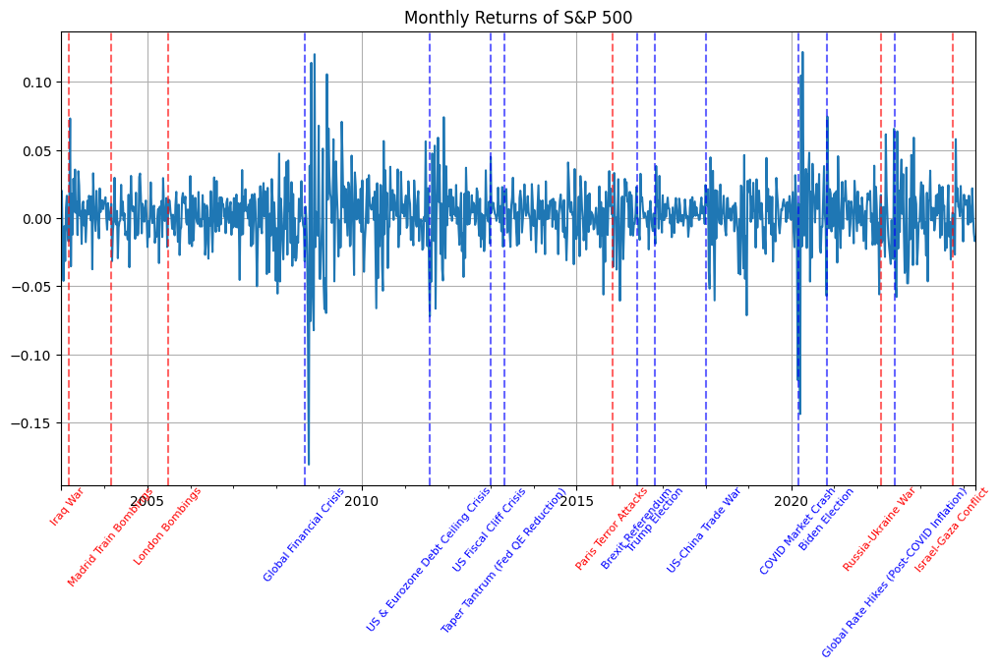

In [9]:
sp500["returns"].plot(figsize=(12,6), title="Monthly Returns of S&P 500", grid=True)


for date, event in economic_political_events.items():
    event_date = pd.to_datetime(date)
    plt.axvline(event_date, color="blue", linestyle="--", alpha=0.6) 
    plt.text(event_date, plt.ylim()[0], event, 
             rotation=50, ha='center', va='top', fontsize=8, color='blue')  

for date, event in geopolitical_events.items():
    event_date = pd.to_datetime(date)
    plt.axvline(event_date, color="red", linestyle="--", alpha=0.6)
    plt.text(event_date, plt.ylim()[0], event, 
             rotation=50, ha='center', va='top', fontsize=8, color='red')

plt.show()


## Less noisy than the daily returns

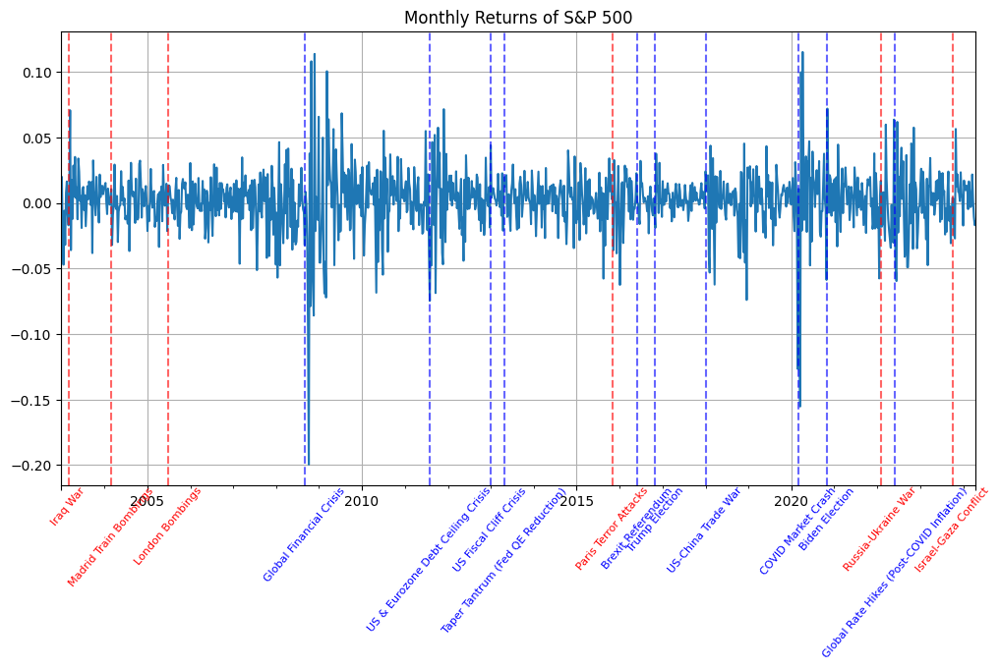

In [10]:
sp500["log_returns"].plot(figsize=(12,6), title="Monthly Returns of S&P 500", grid=True)


for date, event in economic_political_events.items():
    event_date = pd.to_datetime(date)
    plt.axvline(event_date, color="blue", linestyle="--", alpha=0.6) 
    plt.text(event_date, plt.ylim()[0], event, 
             rotation=50, ha='center', va='top', fontsize=8, color='blue')  

for date, event in geopolitical_events.items():
    event_date = pd.to_datetime(date)
    plt.axvline(event_date, color="red", linestyle="--", alpha=0.6)
    plt.text(event_date, plt.ylim()[0], event, 
             rotation=50, ha='center', va='top', fontsize=8, color='red')

plt.show()

In [11]:
print("\nStatistiques descriptives:")
display(sp500.describe())


Statistiques descriptives:


,log_returns,returns,close
count,1112.000000,1112.000000,1112.000000
mean,0.001542,0.001834,237.614934
std,0.024167,0.023985,134.549028
min,-0.199584,-0.180929,69.018803
25%,-0.009345,-0.009302,132.365660
50%,0.003067,0.003071,183.695055
75%,0.014211,0.014312,320.707827
max,0.115113,0.122000,579.224350


The high standard deviation confirms volatility, however these statistics might not be usefull without stationarity


In [12]:
def test_stationarity(series, name):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")

        adf_result = adfuller(series.dropna())
        kpss_result, kpss_p, _, _ = kpss(series.dropna(), regression='c', nlags='auto')

    # ADF Results
    print(f"\n[{name}] ADF Test:")
    print(f"ADF Statistic: {adf_result[0]:.4f}")
    print(f"p-value: {adf_result[1]:.4f}")
    if adf_result[1] < 0.05:
        print("=> The series is likely stationary (reject H0).")
    else:
        print("=> The series is likely non-stationary (fail to reject H0).")

    # KPSS Results
    print(f"\n[{name}] KPSS Test:")
    print(f"KPSS Statistic: {kpss_result:.4f}")
    print(f"p-value: {kpss_p:.4f}")
    if kpss_p < 0.05:
        print("=> The series is likely non-stationary (reject H0 of stationarity).")
    else:
        print("=> The series is likely stationary (fail to reject H0 of stationarity).")

def test_normality(series, name):
    stat, p = jarque_bera(series)
    print(f"\n[{name}] Jarque-Bera Test:")
    print(f"Jarque-Bera Statistic: {stat:.4f}, p-value: {p:.4f}")
    if p < 0.05:
        print("=> The series is likely not normally distributed (reject H0).")
    else:
        print("=> The series is likely normally distributed (fail to reject H0).")

test_stationarity(sp500['returns'], 'Returns')
test_stationarity(sp500['close'], 'Close')
test_stationarity(sp500['log_returns'], 'Log Returns')


[Returns] ADF Test:
ADF Statistic: -20.2751
p-value: 0.0000
=> The series is likely stationary (reject H0).

[Returns] KPSS Test:
KPSS Statistic: 0.1079
p-value: 0.1000
=> The series is likely stationary (fail to reject H0 of stationarity).

[Close] ADF Test:
ADF Statistic: 0.8492
p-value: 0.9924
=> The series is likely non-stationary (fail to reject H0).

[Close] KPSS Test:
KPSS Statistic: 4.6595
p-value: 0.0100
=> The series is likely non-stationary (reject H0 of stationarity).

[Log Returns] ADF Test:
ADF Statistic: -19.9835
p-value: 0.0000
=> The series is likely stationary (reject H0).

[Log Returns] KPSS Test:
KPSS Statistic: 0.1061
p-value: 0.1000
=> The series is likely stationary (fail to reject H0 of stationarity).


Stationarity Analysis (ADF & KPSS Tests)
- The returns and log returns are stationary, meaning their statistical properties (mean, variance) remain stable over time.
- The closing prices are non-stationary, meaning they exhibit trends and require transformation (e.g., differencing) for modeling.


In [13]:
print('\n Test Normality')
test_normality(sp500["close"], "Close")
test_normality(sp500["returns"].dropna(), "Returns")
test_normality(sp500["log_returns"].dropna(), "Log returns")


 Test Normality

[Close] Jarque-Bera Test:
Jarque-Bera Statistic: 165.1594, p-value: 0.0000
=> The series is likely not normally distributed (reject H0).

[Returns] Jarque-Bera Test:
Jarque-Bera Statistic: 2400.6639, p-value: 0.0000
=> The series is likely not normally distributed (reject H0).

[Log returns] Jarque-Bera Test:
Jarque-Bera Statistic: 3487.6670, p-value: 0.0000
=> The series is likely not normally distributed (reject H0).


Price distribution exhibits skewness (fat tail), which can affect predictive models relying on normality.
Since closing prices are not normally distributed, we should be careful with models that assume normality: LR, LogReg, LDA, Gaussian NaiveBayse

Both log and arithmetic returns reject normality, but log returns often reduce skewness and stabilize variance, making them preferable for modeling.



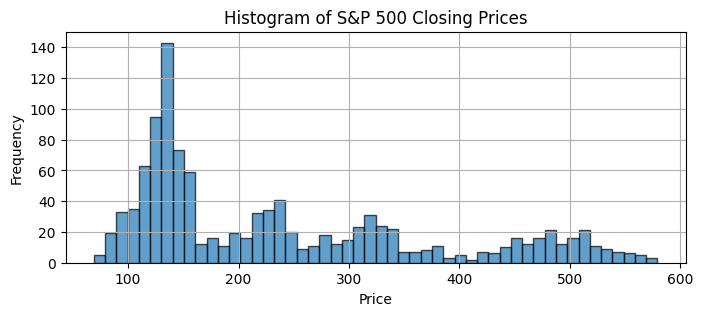

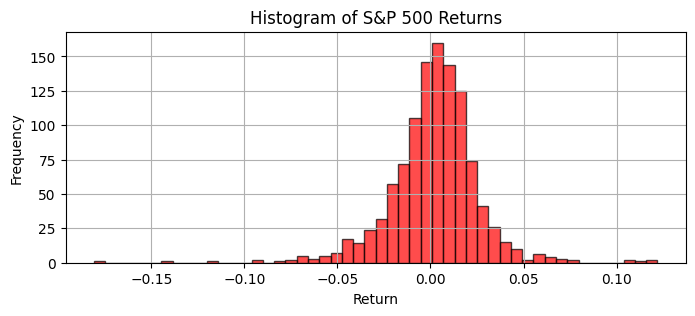

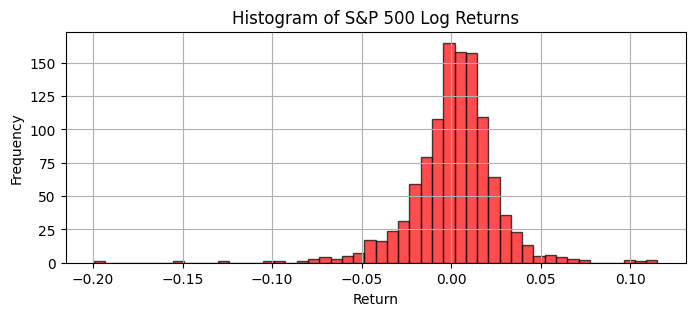

In [14]:
plt.figure(figsize=(8, 3))
plt.hist(sp500['close'].dropna(), bins=50, edgecolor='black', alpha=0.7)
plt.title("Histogram of S&P 500 Closing Prices")
plt.xlabel("Price")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 3))
plt.hist(sp500['returns'].dropna(), bins=50, edgecolor='black', alpha=0.7, color='red')
plt.title("Histogram of S&P 500 Returns")
plt.xlabel("Return")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 3))
plt.hist(sp500['log_returns'].dropna(), bins=50, edgecolor='black', alpha=0.7, color='red')
plt.title("Histogram of S&P 500 Log Returns")
plt.xlabel("Return")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()


The S&P 500 closing prices are highly skewed with multiple peaks, suggesting a non-normal distribution, while returns exhibit a bell-shaped distribution, but with visible fat tails.

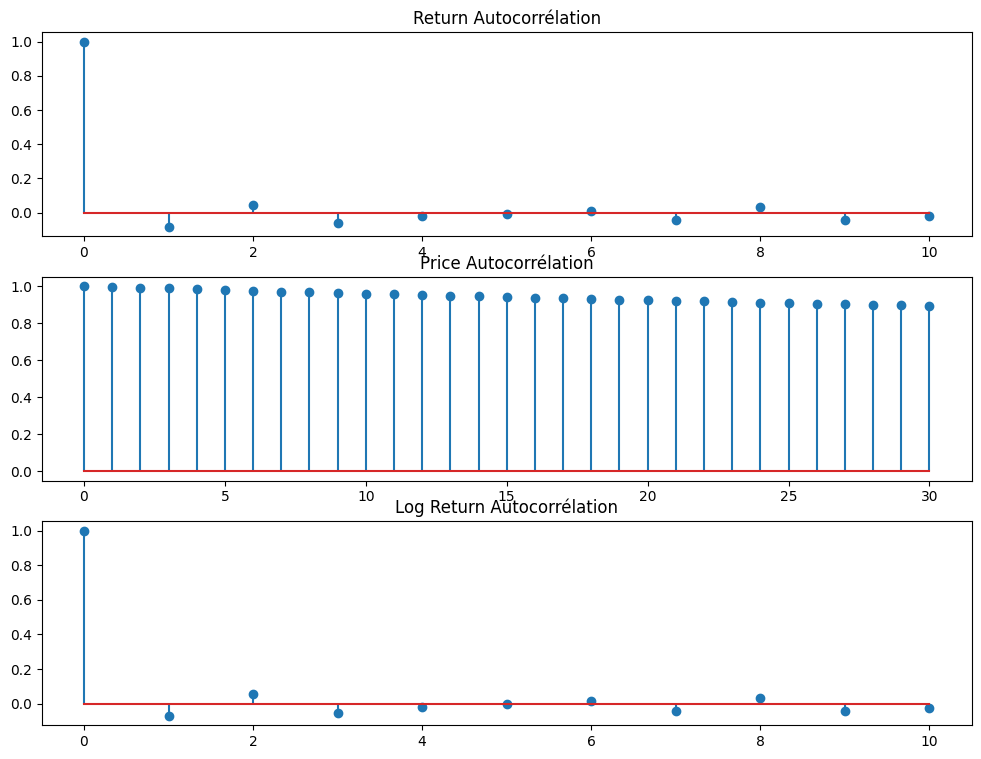

In [15]:
# Autocorrélation et autocorrélation partielle
fig, axes = plt.subplots(3, 1, figsize=(12,9))
axes[0].stem(acf(sp500["returns"].dropna(), nlags=10))
axes[0].set_title("Return Autocorrélation")
axes[2].stem(acf(sp500["log_returns"].dropna(), nlags=10))
axes[2].set_title("Log Return Autocorrélation")
axes[1].stem(acf(sp500["close"].dropna(), nlags=30))
axes[1].set_title("Price Autocorrélation")
plt.show()


Prices show strong autocorrelation (consistent trend over time), while returns have minimal autocorrelation, confirming weak dependence and supporting the random walk hypothesis.

An autoregressive model (AR) or ARIMA might be suitable after transformation.

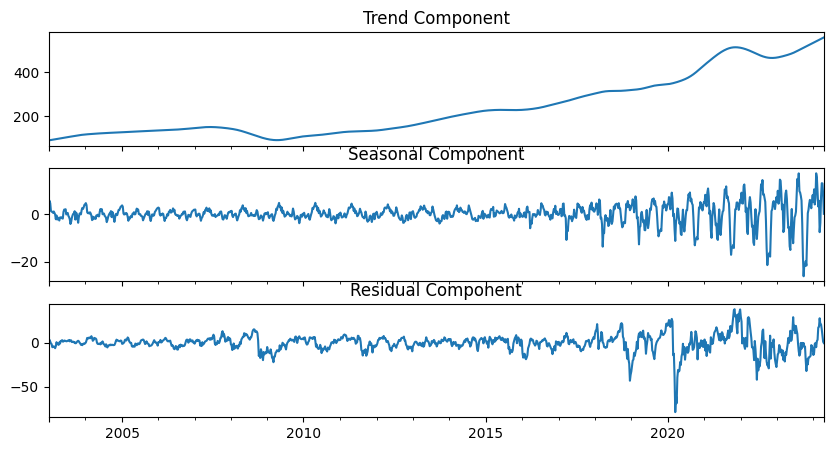

In [ ]:
# Décomposition STL sur l'ensemble de la série temporelle
stl = sm.tsa.STL(sp500['close'], seasonal=13) #13 for short-term seasonality
res = stl.fit()

fig, axes = plt.subplots(3, 1, figsize=(10, 5), sharex=True)
res.trend.plot(ax=axes[0], title="Trend Component")
res.seasonal.plot(ax=axes[1], title="Seasonal Component")
res.resid.plot(ax=axes[2], title="Residual Component")
plt.show()


The STL (Seasonal-Trend decomposition using Loess) method decomposes a time series into three components:
- Trend Component: The long-term movement or direction of the time series.
- Seasonal Component: The repeating pattern that occurs at a fixed frequency.
- Residual Component: The remainder after removing the trend and seasonal components, which represents noise or unexplained variability.

The STL decomposition models the time series 𝑌𝑡 as: 𝑌𝑡 = 𝑇𝑡 + 𝑆𝑡 + 𝑅𝑡


The COVID-19 crash (2020) appears as a sharp dip, followed by a strong recovery. Recent surge (2023-2024) likely reflects a bull market.

- Seasonal Component: There is no strong seasonal pattern, but volatility varies over time, with notable spikes during crises.
- Residual Component: The residual represents what’s leftover after removing the trend and seasonality.
It highlights unexpected movements like shocks, crises, and market anomalies.
Notice the spikes 2008 (financial crisis), 2020 (COVID-19 crash).

# Target variable analysis 



- Prices Are Non-Stationary
    - Stock prices typically follow a random walk, making them non-stationary.
    - Non-stationary series can lead to spurious correlations, making it difficult to model relationships with macroeconomic variables.
    - Predicting prices often just extrapolates the trend rather than capturing meaningful economic relationships
    - Strong Autocorrelation

- Arthmetic Returns
    - Stationarity
    -  Arithmetic Returns Are Not Time-Additive
    -  Sensitive to Large Movements

- Log returns
    - They reduce skewness compared to arithmetic returns.
    - This makes long-term return estimation easier since time additive.
    - Stationarity

### Horizons
- A 5-day (weekly) horizon balances short-term market dynamics with medium-term macro trends. Many variables (e.g., 20-day rolling changes, Sharpe ratios) capture trends over weeks & months, making them more relevant for weekly rather than daily forecasts. This reduces noise while maintaining responsiveness to market shifts.
We could try monthly but I believe not enough data


### We will create a model that forecast the weekly log_returns 
The metrics we will use is the RMSE (to penalize large error), MAE if you prefer a more balanced and the DA to check efficienchy in a trading environment

# Exploratory Data Analysis (EDA)
- Visualize correlations between each macro-financial variable and the target.
- Visualize correlations between each macro-financial variable together.



In [17]:
file_path = "data/features.csv"
features = pd.read_csv(file_path, index_col=0)
features.sort_index(inplace=True)
features.index = pd.to_datetime(features.index)
features

,BCOM_Energy_Sharpe_100d,BCOM_Energy_Sharpe_120d,BCOM_Energy_Sharpe_250d,BCOM_Ind_Metals_Sharpe_100d,BCOM_Ind_Metals_Sharpe_120d,BCOM_Ind_Metals_Sharpe_250d,FX_EM_Basket_Sharpe_100d,FX_EM_Basket_Sharpe_120d,FX_EM_Basket_Sharpe_250d,Dollar_Index_Sharpe_100d,Dollar_Index_Sharpe_120d,Dollar_Index_Sharpe_250d,SP_500_Sharpe_100d,SP_500_Sharpe_120d,SP_500_Sharpe_250d,Nasdaq_100_Sharpe_100d,Nasdaq_100_Sharpe_120d,Nasdaq_100_Sharpe_250d,Russel_2000_Sharpe_100d,Russel_2000_Sharpe_120d,Russel_2000_Sharpe_250d,Euro_Stoxx_50_Sharpe_100d,Euro_Stoxx_50_Sharpe_120d,Euro_Stoxx_50_Sharpe_250d,FTSE_100_Sharpe_100d,FTSE_100_Sharpe_120d,FTSE_100_Sharpe_250d,Nikkei_225_Sharpe_100d,Nikkei_225_Sharpe_120d,Nikkei_225_Sharpe_250d,MSCI_EM_Sharpe_100d,MSCI_EM_Sharpe_120d,MSCI_EM_Sharpe_250d,SP_500_Vol_10d,SP_500_Vol_20d,SP_500_Vol_30d,SP_500_Distance_to_MA_250d,SP_500_Distance_to_MA_500d,SP_500_Pct_Chg_20d,SP_500_Pct_Chg_120d,SP_500_Pct_Chg_250d,Nasdaq_100_Pct_Chg_20d,Nasdaq_100_Pct_Chg_120d,Nasdaq_100_Pct_Chg_250d,Russel_2000_Pct_Chg_20d,Russel_2000_Pct_Chg_120d,Russel_2000_Pct_Chg_250d,Euro_Stoxx_50_Pct_Chg_20d,Euro_Stoxx_50_Pct_Chg_120d,Euro_Stoxx_50_Pct_Chg_250d,FTSE_100_Pct_Chg_20d,FTSE_100_Pct_Chg_120d,FTSE_100_Pct_Chg_250d,Nikkei_225_Pct_Chg_20d,Nikkei_225_Pct_Chg_120d,Nikkei_225_Pct_Chg_250d,MSCI_EM_Pct_Chg_20d,MSCI_EM_Pct_Chg_120d,MSCI_EM_Pct_Chg_250d,US_10Y_Chg_100d,US_10Y_Chg_120d,US_10Y_Chg_250d,US_2Y_Chg_100d,US_2Y_Chg_120d,US_2Y_Chg_250d,US_Real_10Y_Chg_100d,US_Real_10Y_Chg_120d,US_Real_10Y_Chg_250d,US_BE_10Y_Chg_100d,US_BE_10Y_Chg_120d,US_BE_10Y_Chg_250d,US_Libor_Chg_100d,US_Libor_Chg_120d,US_Libor_Chg_250d,US_10Y_vs_Libor,US_2Y_vs_Libor,US_Real_10Y_vs_Libor,US_BE_10Y_vs_Libor,Global_Eco_Surprise,US_Eco_Surprise,EU_Eco_Surprise,JP_Eco_Surprise,EM_Eco_Surprise,China_Eco_Surprise,Citi_Macro_Risk_Index,US_SP_500_Pct_above_200d_MA,US_Nasdaq_100_Pct_above_200d_MA,US_Russel_2000_Pct_above_200d_MA,EU_Euro_Stoxx_50_Pct_above_200d_MA,UK_FTSE_100_Pct_above_200d_MA,Japan_Nikkei_225_Pct_above_200d_MA,MSCI_EM_USD_Pct_above_200d_MA,Risk_Aversion,Risk_Aversion_20d_MA,Risk_Aversion_60d_MA,SP_500_EPS_Pct_Chg_20d,SP_500_EPS_Pct_Chg_120d,SP_500_EPS_Pct_Chg_250d,SP_500_Sales_Pct_Chg_20d,SP_500_Sales_Pct_Chg_120d,SP_500_Sales_Pct_Chg_250d,SP_500_PS_Pct_Chg_20d,SP_500_PS_Pct_Chg_120d,SP_500_PS_Pct_Chg_250d,SP_500_PE_Pct_Chg_20d,SP_500_PE_Pct_Chg_120d,SP_500_PE_Pct_Chg_250d,VIX_Curve,VIX_20d_MA,VIX_60d_MA,Put_Call_Ratio,Put_Call_Ratio_20d_MA,Put_Call_Ratio_60d_MA,VVIX_Index_Zscore_250d,Correl_Equity__Bond_20d,Correl_Equity__Bond_60d,Correl_Equity__Bond_120d,Correl_Equity__Bond_250d,US_HY_Sharpe_100d,US_HY_Sharpe_120d,US_HY_Sharpe_250d,US_CDS_HY_Sharpe_100d,US_CDS_HY_Sharpe_120d,US_CDS_HY_Sharpe_250d,EU_HY_Sharpe_100d,EU_HY_Sharpe_120d,EU_HY_Sharpe_250d,EU_Xover_Sharpe_100d,EU_Xover_Sharpe_120d,EU_Xover_Sharpe_250d,Emerging_Bond_Sharpe_100d,Emerging_Bond_Sharpe_120d,Emerging_Bond_Sharpe_250d
2003-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.65050,0.39410,1.01900,0.24990,4.3,-6.0,-22.7,-13.6,20.0,NaN,0.480,35.81,45.00,35.65,10.00,18.81,11.82,37.70,-0.485110,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [18]:
for col, na in features.isna().sum().items():
    print(col, '--------------',  na)

BCOM_Energy_Sharpe_100d -------------- 101
BCOM_Energy_Sharpe_120d -------------- 121
BCOM_Energy_Sharpe_250d -------------- 251
BCOM_Ind_Metals_Sharpe_100d -------------- 101
BCOM_Ind_Metals_Sharpe_120d -------------- 121
BCOM_Ind_Metals_Sharpe_250d -------------- 251
FX_EM_Basket_Sharpe_100d -------------- 101
FX_EM_Basket_Sharpe_120d -------------- 121
FX_EM_Basket_Sharpe_250d -------------- 251
Dollar_Index_Sharpe_100d -------------- 101
Dollar_Index_Sharpe_120d -------------- 121
Dollar_Index_Sharpe_250d -------------- 251
SP_500_Sharpe_100d -------------- 101
SP_500_Sharpe_120d -------------- 121
SP_500_Sharpe_250d -------------- 251
Nasdaq_100_Sharpe_100d -------------- 101
Nasdaq_100_Sharpe_120d -------------- 121
Nasdaq_100_Sharpe_250d -------------- 251
Russel_2000_Sharpe_100d -------------- 101
Russel_2000_Sharpe_120d -------------- 121
Russel_2000_Sharpe_250d -------------- 251
Euro_Stoxx_50_Sharpe_100d -------------- 101
Euro_Stoxx_50_Sharpe_120d -------------- 121
Euro_St

- 1. Market Index & Performance Metrics: 
  - S&P 500, Nasdaq 100, Russell 2000, Euro Stoxx 50, FTSE 100, Nikkei 225, MSCI EM : Major global equity indices, tracking stock market performance.
  -  Pct Change (20d, 120d, 250d)
  - Sharpe Ratios (100d, 120d, 250d): Risk-adjusted return metric for different markets.

- 2. Volatility & Market Sentiment:
  - SP 500 Vol (10d, 20d, 30d) : Measures historical volatility of the S&P 500.
  - VIX Curve, VIX 20d MA, VIX 60d MA : Volatility Index (VIX) represents market expectations of future volatility.
  - Put/Call Ratio & VIX Index Z-Score (250d) : Measures sentiment and potential market stress.

- 3. Fixed Income & Interest Rates
    - US 10Y, 2Y, Real 10Y, BE 10Y (Change 100d, 120d, 250d): Represents changes in US Treasury yields and break-even inflation expectations.
    - US Libor (Change 100d, 120d, 250d) & US 10Y vs Libor : Measures short-term funding costs and risk premia in bond markets.
    - US HY & US CDS HY Sharpe Ratios : Measures risk-adjusted returns on high-yield bonds and CDS spreads.

- 4. Commodity & FX Markets
   - BCOM Energy & Industrial Metals Sharpe Ratios: Risk-adjusted returns on commodity indices, representing energy & metals performance.
    - FX EM Basket & Dollar Index Sharpe Ratios: Performance of emerging market currencies vs. USD.

- 5. Macroeconomic Indicators
    - Global, US, EU, JP, EM, China Economic Surprise Indices: Measures how economic data releases compare to expectations.
    - Citi Macro Risk Index : Aggregates economic and financial risk signals.
    - Risk Aversion Indices (20d, 60d MA): Quantifies market risk sentiment.


- 6. Equity Market Valuation Metrics
    - SP 500 EPS/Sales/PS/PE Pct Change (20d, 120d, 250d): Tracks earnings and sales growth, indicating valuation trends.
    - US Equity % Above 200d MA (S&P 500, Nasdaq, Russell, etc.): Measures breadth and trend strength of equity markets.


- 7. Bond-Equity Relationships
    - Equity-Bond Correlations (20d, 60d, 120d, 250d): Shows risk-on/risk-off market behavior.
    - EU HY & Xover Sharpe Ratios : High-yield bonds & crossover bond market risk-adjusted returns.
    - Emerging Bond Sharpe Ratios: Measures risk-adjusted performance of emerging market debt.


### Resemple to our weekly target

In [19]:
# Define columns by aggregation type
cols_last = [col for col in features.columns if '_Pct_Chg' in col or '_Chg_' in col or '_Surprise' in col]
cols_mean = [col for col in features.columns if col not in cols_last]

# Perform resampling efficiently using `pd.concat`
resampled_features = pd.concat([
    features[cols_last].resample('W-FRI').last(),
    features[cols_mean].resample('W-FRI').mean()
], axis=1)


features = resampled_features.copy()
features


,SP_500_Pct_Chg_20d,SP_500_Pct_Chg_120d,SP_500_Pct_Chg_250d,Nasdaq_100_Pct_Chg_20d,Nasdaq_100_Pct_Chg_120d,Nasdaq_100_Pct_Chg_250d,Russel_2000_Pct_Chg_20d,Russel_2000_Pct_Chg_120d,Russel_2000_Pct_Chg_250d,Euro_Stoxx_50_Pct_Chg_20d,Euro_Stoxx_50_Pct_Chg_120d,Euro_Stoxx_50_Pct_Chg_250d,FTSE_100_Pct_Chg_20d,FTSE_100_Pct_Chg_120d,FTSE_100_Pct_Chg_250d,Nikkei_225_Pct_Chg_20d,Nikkei_225_Pct_Chg_120d,Nikkei_225_Pct_Chg_250d,MSCI_EM_Pct_Chg_20d,MSCI_EM_Pct_Chg_120d,MSCI_EM_Pct_Chg_250d,US_10Y_Chg_100d,US_10Y_Chg_120d,US_10Y_Chg_250d,US_2Y_Chg_100d,US_2Y_Chg_120d,US_2Y_Chg_250d,US_Real_10Y_Chg_100d,US_Real_10Y_Chg_120d,US_Real_10Y_Chg_250d,US_BE_10Y_Chg_100d,US_BE_10Y_Chg_120d,US_BE_10Y_Chg_250d,US_Libor_Chg_100d,US_Libor_Chg_120d,US_Libor_Chg_250d,Global_Eco_Surprise,US_Eco_Surprise,EU_Eco_Surprise,JP_Eco_Surprise,EM_Eco_Surprise,China_Eco_Surprise,SP_500_EPS_Pct_Chg_20d,SP_500_EPS_Pct_Chg_120d,SP_500_EPS_Pct_Chg_250d,SP_500_Sales_Pct_Chg_20d,SP_500_Sales_Pct_Chg_120d,SP_500_Sales_Pct_Chg_250d,SP_500_PS_Pct_Chg_20d,SP_500_PS_Pct_Chg_120d,SP_500_PS_Pct_Chg_250d,SP_500_PE_Pct_Chg_20d,SP_500_PE_Pct_Chg_120d,SP_500_PE_Pct_Chg_250d,BCOM_Energy_Sharpe_100d,BCOM_Energy_Sharpe_120d,BCOM_Energy_Sharpe_250d,BCOM_Ind_Metals_Sharpe_100d,BCOM_Ind_Metals_Sharpe_120d,BCOM_Ind_Metals_Sharpe_250d,FX_EM_Basket_Sharpe_100d,FX_EM_Basket_Sharpe_120d,FX_EM_Basket_Sharpe_250d,Dollar_Index_Sharpe_100d,Dollar_Index_Sharpe_120d,Dollar_Index_Sharpe_250d,SP_500_Sharpe_100d,SP_500_Sharpe_120d,SP_500_Sharpe_250d,Nasdaq_100_Sharpe_100d,Nasdaq_100_Sharpe_120d,Nasdaq_100_Sharpe_250d,Russel_2000_Sharpe_100d,Russel_2000_Sharpe_120d,Russel_2000_Sharpe_250d,Euro_Stoxx_50_Sharpe_100d,Euro_Stoxx_50_Sharpe_120d,Euro_Stoxx_50_Sharpe_250d,FTSE_100_Sharpe_100d,FTSE_100_Sharpe_120d,FTSE_100_Sharpe_250d,Nikkei_225_Sharpe_100d,Nikkei_225_Sharpe_120d,Nikkei_225_Sharpe_250d,MSCI_EM_Sharpe_100d,MSCI_EM_Sharpe_120d,MSCI_EM_Sharpe_250d,SP_500_Vol_10d,SP_500_Vol_20d,SP_500_Vol_30d,SP_500_Distance_to_MA_250d,SP_500_Distance_to_MA_500d,US_10Y_vs_Libor,US_2Y_vs_Libor,US_Real_10Y_vs_Libor,US_BE_10Y_vs_Libor,Citi_Macro_Risk_Index,US_SP_500_Pct_above_200d_MA,US_Nasdaq_100_Pct_above_200d_MA,US_Russel_2000_Pct_above_200d_MA,EU_Euro_Stoxx_50_Pct_above_200d_MA,UK_FTSE_100_Pct_above_200d_MA,Japan_Nikkei_225_Pct_above_200d_MA,MSCI_EM_USD_Pct_above_200d_MA,Risk_Aversion,Risk_Aversion_20d_MA,Risk_Aversion_60d_MA,VIX_Curve,VIX_20d_MA,VIX_60d_MA,Put_Call_Ratio,Put_Call_Ratio_20d_MA,Put_Call_Ratio_60d_MA,VVIX_Index_Zscore_250d,Correl_Equity__Bond_20d,Correl_Equity__Bond_60d,Correl_Equity__Bond_120d,Correl_Equity__Bond_250d,US_HY_Sharpe_100d,US_HY_Sharpe_120d,US_HY_Sharpe_250d,US_CDS_HY_Sharpe_100d,US_CDS_HY_Sharpe_120d,US_CDS_HY_Sharpe_250d,EU_HY_Sharpe_100d,EU_HY_Sharpe_120d,EU_HY_Sharpe_250d,EU_Xover_Sharpe_100d,EU_Xover_Sharpe_120d,EU_Xover_Sharpe_250d,Emerging_Bond_Sharpe_100d,Emerging_Bond_Sharpe_120d,Emerging_Bond_Sharpe_250d
2003-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.3,-6.0,-22.7,-13.6,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.650500,0.394100,1.019000,0.249900,0.480000,35.810000,45.000,35.650,10.000,18.810,11.820,37.700000,-0.485110,NaN,NaN,NaN,NaN,NaN,0.620000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2003-01-10,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.1,-1.4,-29.5,-4.1,19.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.668730,0.388930,1.008150,0.273790,0.444000,39.476000,52.200,35.298,9.018,16.474,14.092,41.648

### Scatter Plot of the variables with against the taarget variables

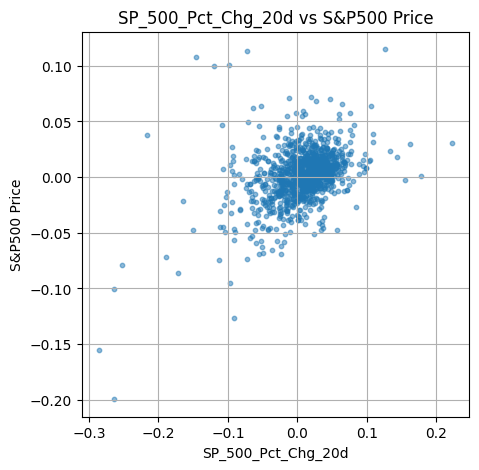

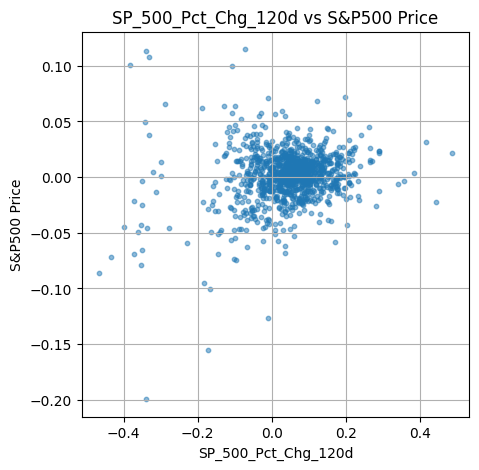

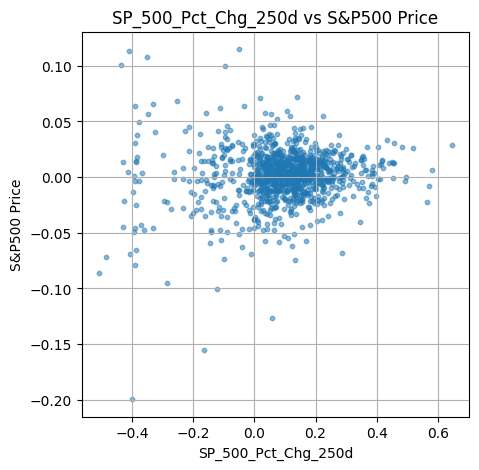

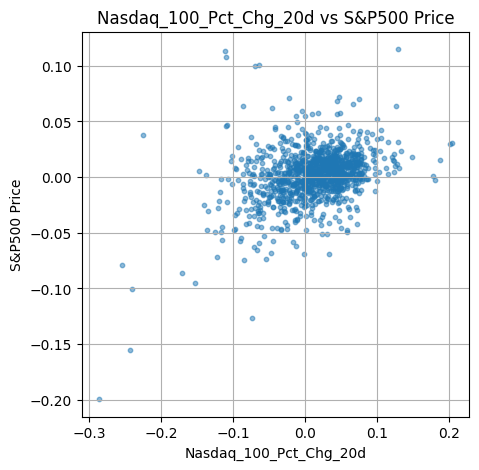

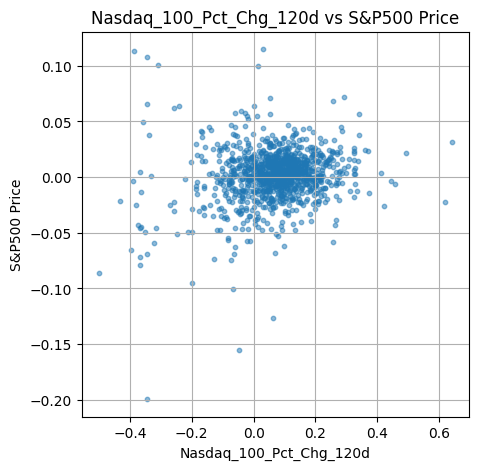

...

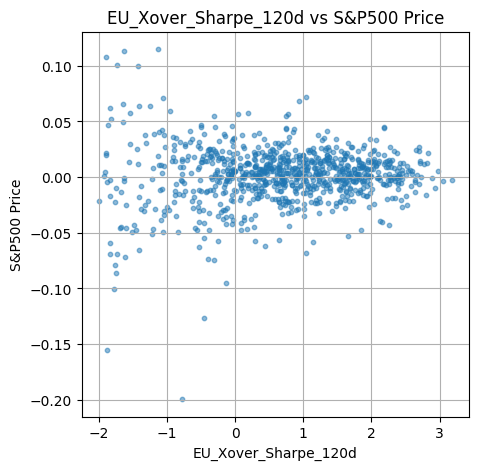

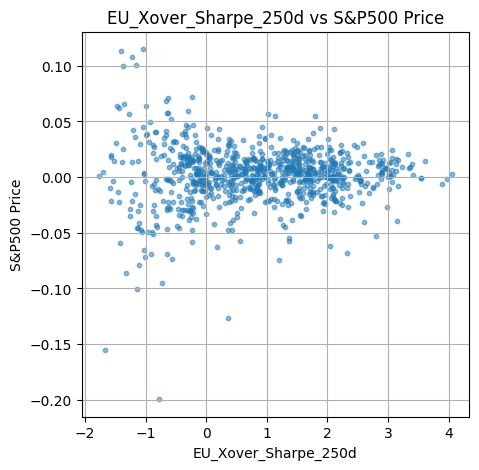

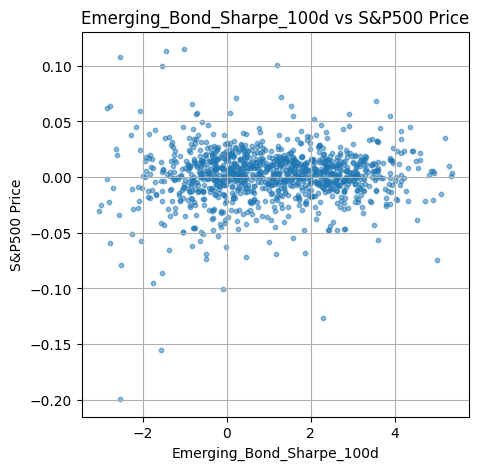

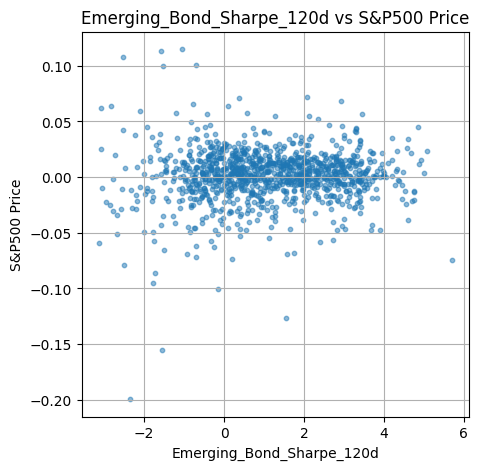

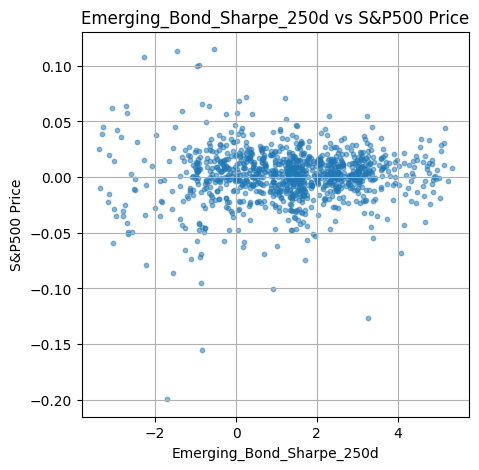

In [22]:
target_variable = sp500['log_returns']

for feature in features.columns:
    plt.figure(figsize=(5, 5))
    plt.scatter(features[feature], target_variable, alpha=0.5, s=10)
    plt.xlabel(feature)
    plt.ylabel('S&P500 Price')
    plt.title(f"{feature} vs S&P500 Price")
    plt.grid(True)
    plt.show()

- No variable seems to have a visible very strong linear relationship wiht the target variable but we will further invesitgate with the corrleation calculations and some variable seems to have a particualr relationship
- Relationship could be not linear but need more investigation
- Variables of the same type (same prefix) looks very similar and might carry ismilar informationn we will see their correlation

In [ ]:
pearson_corr_close = features.dropna().corrwith(sp500.loc[features.index]['close'], method='pearson')
spearman_corr_close = features.dropna().corrwith(sp500.loc[features.index]['close'], method='spearman')

pearson_corr_returns = features.dropna().corrwith(sp500.loc[features.index]['returns'], method='pearson')
spearman_corr_returns = features.dropna().corrwith(sp500.loc[features.index]['returns'], method='spearman')

pearson_corr_log_returns = features.dropna().corrwith(sp500.loc[features.index]['log_returns'], method='pearson')
spearman_corr_log_returns = features.dropna().corrwith(sp500.loc[features.index]['log_returns'], method='spearman')

correlation_results = pd.DataFrame({
    'Pearson Close': pearson_corr_close,
    'Spearman Close': spearman_corr_close,
    'Pearson Returns': pearson_corr_returns,
    'Spearman Returns': spearman_corr_returns,
    'Pearson Log Returns': pearson_corr_log_returns,
    'Spearman Log Returns': spearman_corr_log_returns
})

correlation_results

,Pearson Close,Spearman Close,Pearson Returns,Spearman Returns,Pearson Log Returns,Spearman Log Returns
SP_500_Pct_Chg_20d,0.013525,0.015751,0.385065,0.355066,0.395507,0.355066
SP_500_Pct_Chg_120d,0.073984,0.025409,0.120304,0.109914,0.130522,0.109914
SP_500_Pct_Chg_250d,0.153085,0.060858,0.032360,0.054197,0.041328,0.054197
Nasdaq_100_Pct_Chg_20d,-0.004707,0.020834,0.345659,0.314126,0.353860,0.314126
Nasdaq_100_Pct_Chg_120d,0.050641,0.050620,0.123951,0.119791,0.131401,0.119791
...,...,...,...,...,...,...
EU_Xover_Sharpe_120d,-0.002318,-0.031413,0.026425,0.007750,0.036925,0.007750
EU_Xover_Sharpe_250d,-0.008447,-0.004637,-0.018217,-0.012362,-0.009183,-0.012362
Emerging_Bond_Sharpe_100d,-0.328643,-0.300999,0.018697,0.018326,0.022540,0.018326
Emerging_Bond_Sharpe_120d,-0.344606,-0.309387,0.014952,0.017860,0.019328,0.017860


- The high correlation with price may be inflated due to shared trends rather than true predictive power.

We indeed some variable that seems to have a predictive power on the S&P Price suhc as BCOM_Energy_Sharpe_250d or Emerging_Bond_Sharpe_250d but this is liklely an inflated 

### Features relationships

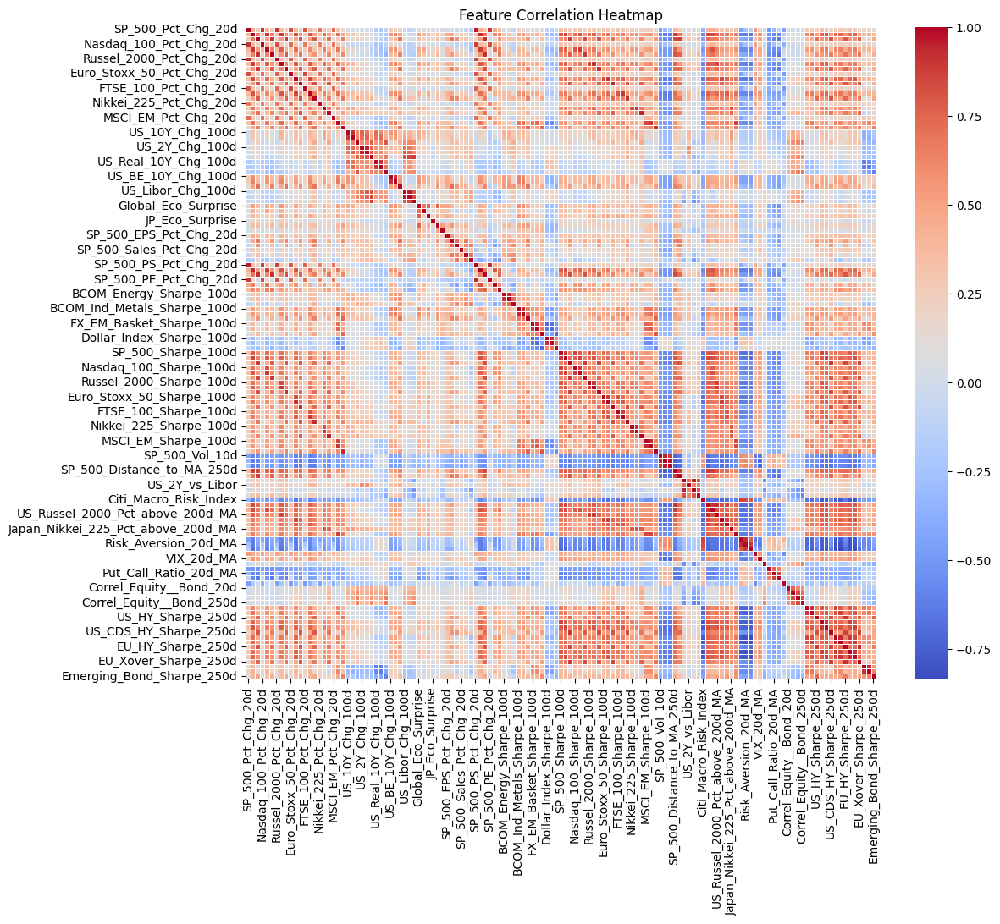

In [21]:
correlation_matrix = features.corr(method="pearson")

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap="coolwarm", annot=False, fmt=".2f", linewidths=0.5, cbar=True)
plt.title("Feature Correlation Heatmap")
plt.show()

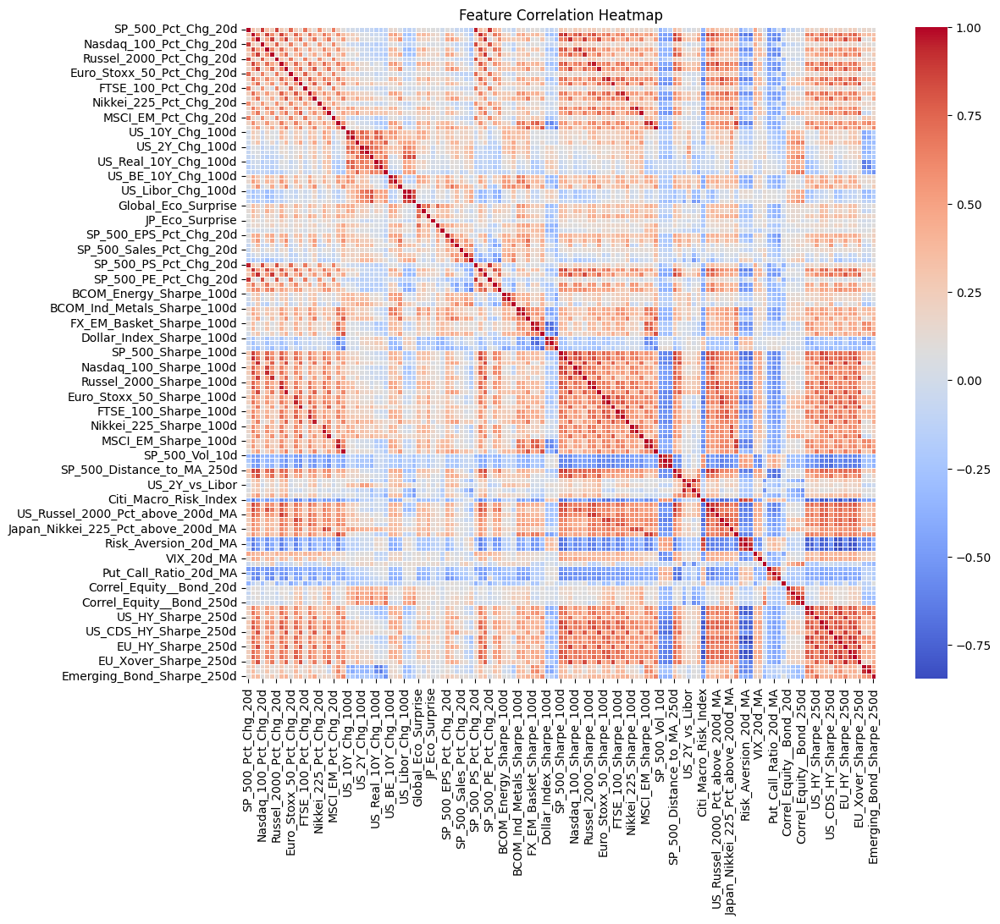

In [22]:
correlation_matrix = features.corr(method="spearman")

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap="coolwarm", annot=False, fmt=".2f", linewidths=0.5, cbar=True)
plt.title("Feature Correlation Heatmap")
plt.show()